In [4]:
import os
import glob


folder_path = "./drive/MyDrive/StyleTransfer"


file_list = []
for file_path in glob.glob(os.path.join(folder_path, "*")):
    file_list.append(file_path)
print(file_list)

['./drive/MyDrive/StyleTransfer/styleImage.jpg', './drive/MyDrive/StyleTransfer/targetImage.png']


## Neural style transfer Using Already trained model

In [10]:
import tensorflow_hub as hub
import tensorflow as tf
from matplotlib import pyplot as plt
import numpy as np
import cv2

In [11]:
model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

In [12]:
def load_image(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = img[tf.newaxis, :]
    return img

In [13]:
content_image = load_image('./drive/MyDrive/StyleTransfer/targetImage.png')
style_image = load_image('./drive/MyDrive/StyleTransfer/styleImage.jpg')

In [14]:
content_image.shape

TensorShape([1, 1536, 2048, 3])

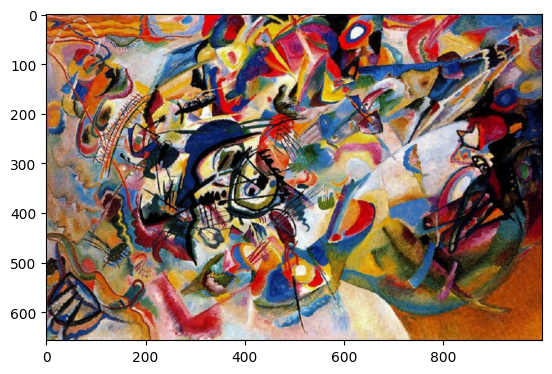

In [15]:
plt.imshow(np.squeeze(style_image))
plt.show()

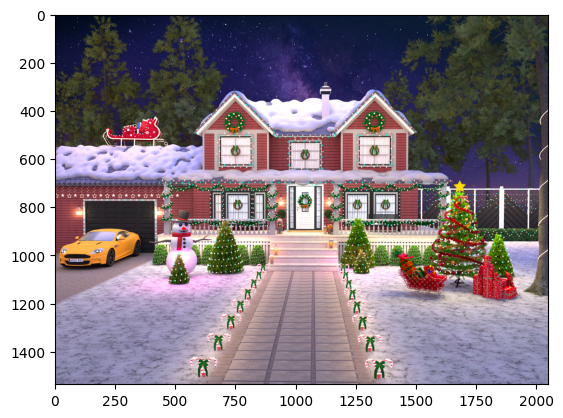

In [16]:
plt.imshow(np.squeeze(content_image))
plt.show()

In [17]:
stylized_image = model(tf.constant(content_image), tf.constant(style_image))[0]

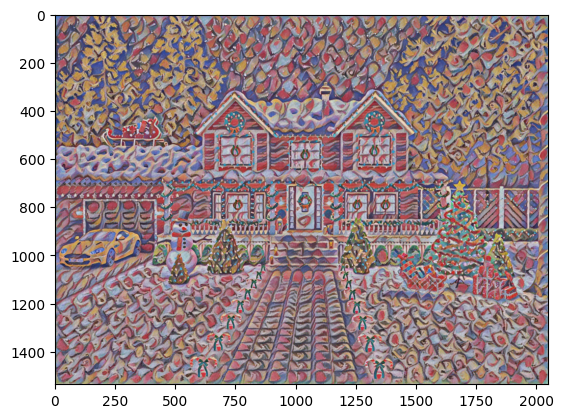

In [18]:
plt.imshow(np.squeeze(stylized_image))
plt.show()

In [ ]:
cv2.imwrite('generated_img.jpg', cv2.cvtColor(np.squeeze(stylized_image)*255, cv2.COLOR_BGR2RGB))

True

# Neural style transfer Using Artistic Style




In [19]:
import os
import tensorflow as tf

In [20]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import PIL.Image
import time
import functools

In [21]:
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

In [22]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [23]:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_image_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_image_shape)
  img = img[tf.newaxis, :]
  return img

In [24]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  plt.title(title)

In [25]:
content_path = "./drive/MyDrive/StyleTransfer/targetImage.png"
style_path = "./drive/MyDrive/StyleTransfer/styleImage.jpg"

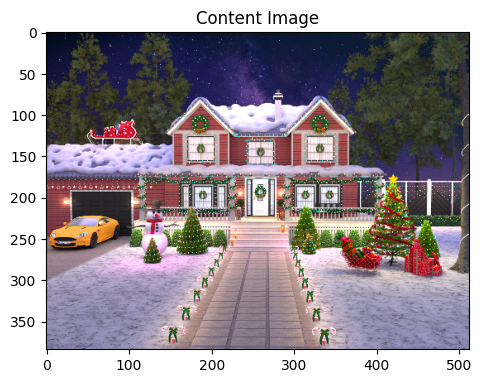

In [26]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

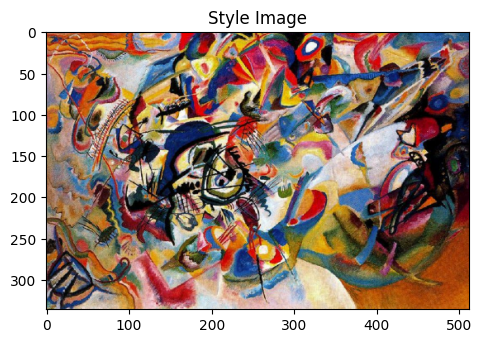

In [27]:
plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

In [28]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))

### Removing the last Fully Connected Layers

In [29]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)

80134624/80134624 [==============================] - 1s 0us/step

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [30]:
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

#### Creates a VGG model that returns a list of intermediate output values.

In [31]:
def vgg_layers(layer_names):
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

In [32]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#### Look at the statistics of each layer's output

In [33]:
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  mean: ", output.numpy().mean())
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print()

block1_conv1
  shape:  (1, 336, 512, 64)
  mean:  33.97525
  min:  0.0
  max:  835.5256

block2_conv1
  shape:  (1, 168, 256, 128)
  mean:  199.82687
  min:  0.0
  max:  4625.8857

block3_conv1
  shape:  (1, 84, 128, 256)
  mean:  230.78104
  min:  0.0
  max:  8789.24

block4_conv1
  shape:  (1, 42, 64, 512)
  mean:  791.2401
  min:  0.0
  max:  21566.135

block5_conv1
  shape:  (1, 21, 32, 512)
  mean:  59.179478
  min:  0.0
  max:  3189.254



In [34]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

In [35]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [36]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

In [37]:
print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print("-----------------------------------------")

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.14740433
    max:  25793.834
    mean:  815.94604
-----------------------------------------
   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  244309.33
    mean:  27071.242
-----------------------------------------
   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  969801.3
    mean:  30614.727
-----------------------------------------
   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  8720750.0
    mean:  406738.8
-----------------------------------------
   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  256065.83
    mean:  3868.4937
-----------------------------------------


In [38]:
print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print("-----------------------------------------")

Contents:
   block5_conv2
    shape:  (1, 24, 32, 512)
    min:  0.0
    max:  2029.8845
    mean:  23.288202
-----------------------------------------


Run gradient descent

In [39]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [40]:
image = tf.Variable(content_image)

In [41]:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [42]:
def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

  return x_var, y_var

In [43]:
x_deltas, y_deltas = high_pass_x_y(content_image)

In [44]:
def total_variation_loss(image):
  x_deltas, y_deltas = high_pass_x_y(image)
  return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

In [45]:
total_variation_loss(image).numpy()
tf.image.total_variation(image).numpy()
total_variation_weight=30

In [46]:
style_weight=1e-2
content_weight=1e4

In [47]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [48]:
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

In [49]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)

Epoch :  0
Train step: 100


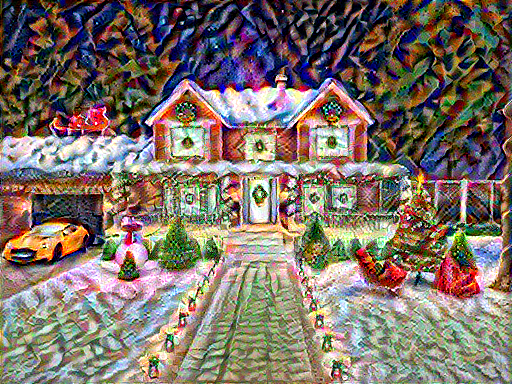

-----------------------------------------------------------------------------------------
Epoch :  1
Train step: 200


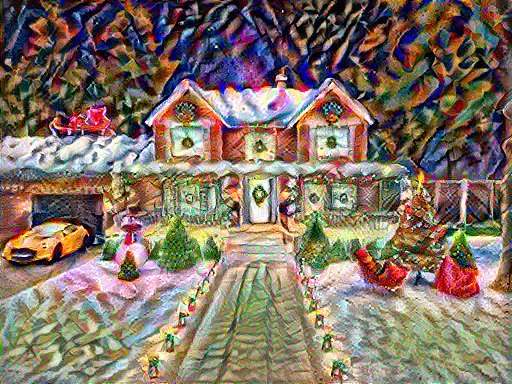

-----------------------------------------------------------------------------------------
Epoch :  2
Train step: 300


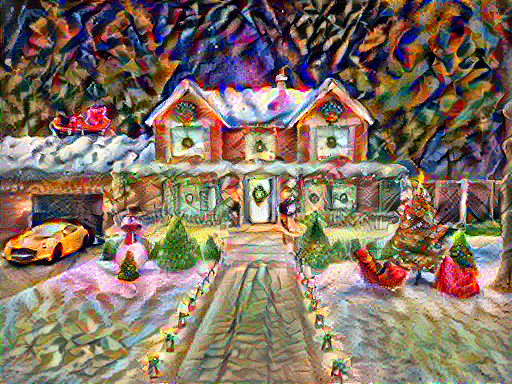

-----------------------------------------------------------------------------------------
Epoch :  3
Train step: 400


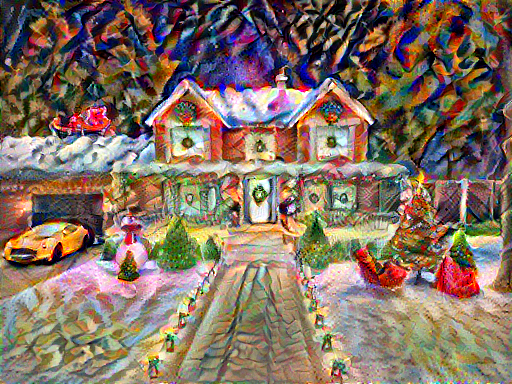

-----------------------------------------------------------------------------------------
Epoch :  4
Train step: 500


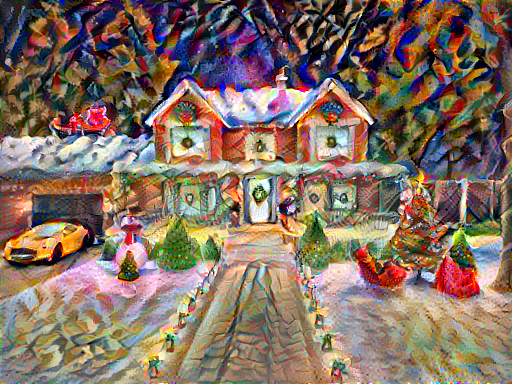

-----------------------------------------------------------------------------------------
Epoch :  5
Train step: 600


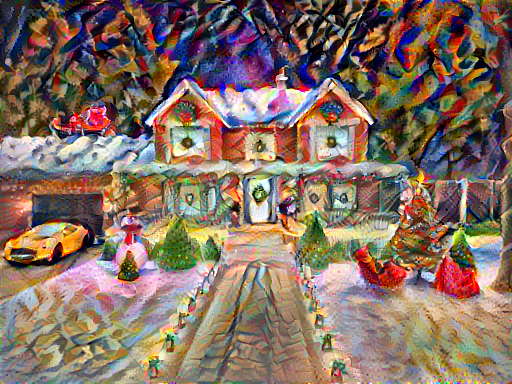

-----------------------------------------------------------------------------------------
Epoch :  6
Train step: 700


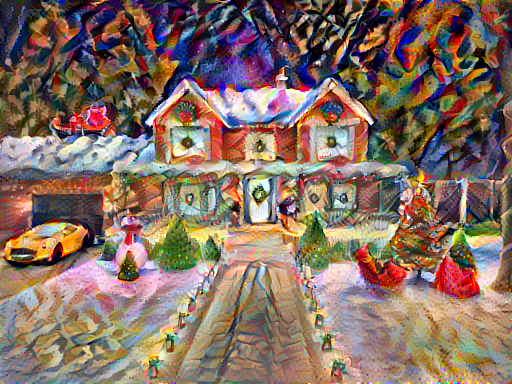

-----------------------------------------------------------------------------------------
Epoch :  7
Train step: 800


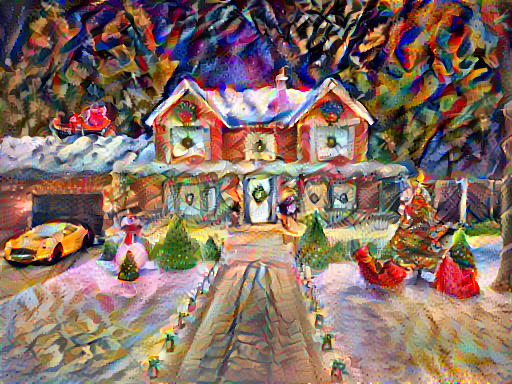

-----------------------------------------------------------------------------------------
Epoch :  8
Train step: 900


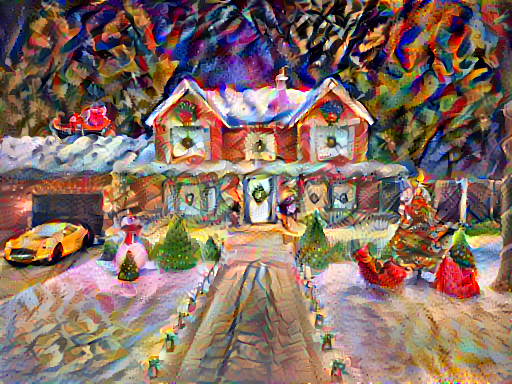

-----------------------------------------------------------------------------------------
Epoch :  9
Train step: 1000


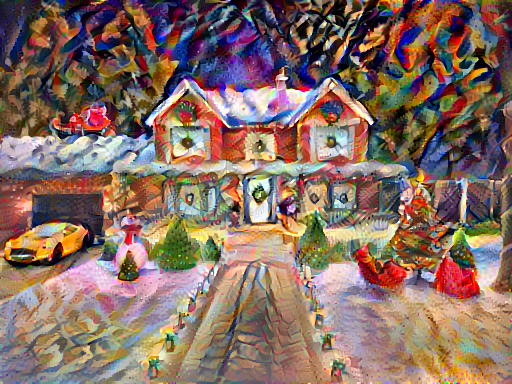

-----------------------------------------------------------------------------------------
Epoch :  10
Train step: 1100


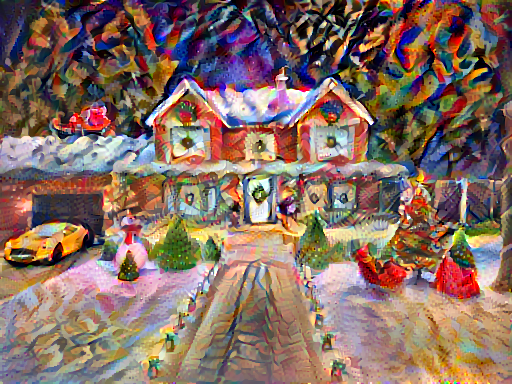

-----------------------------------------------------------------------------------------
Epoch :  11
Train step: 1200


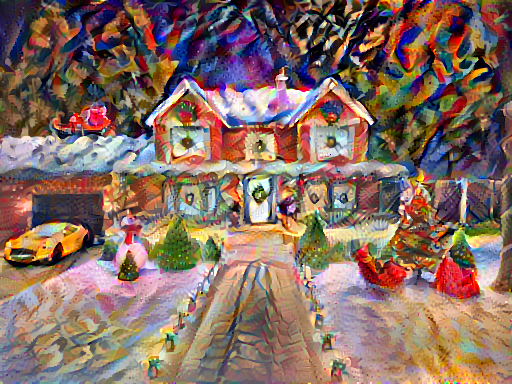

-----------------------------------------------------------------------------------------
Epoch :  12
Train step: 1300


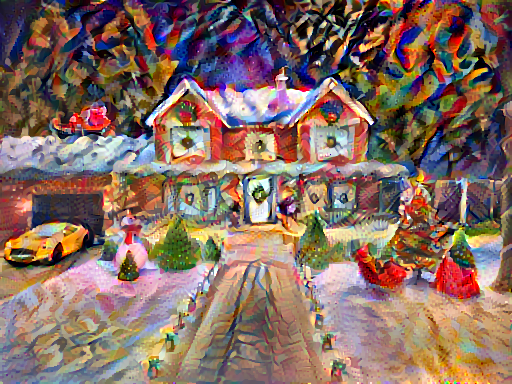

-----------------------------------------------------------------------------------------
Epoch :  13
Train step: 1400


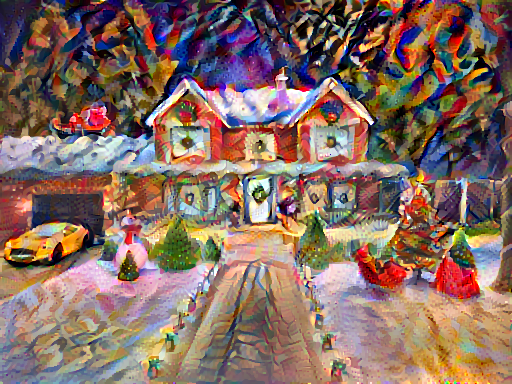

-----------------------------------------------------------------------------------------
Epoch :  14
Train step: 1500


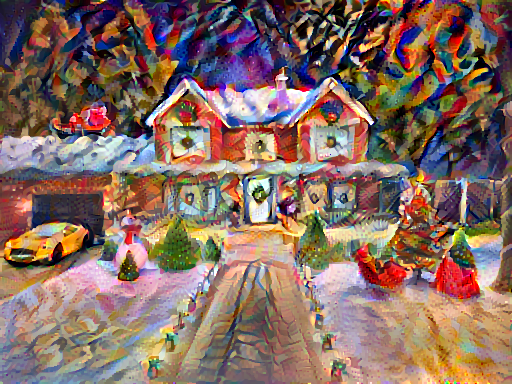

-----------------------------------------------------------------------------------------
Epoch :  15
Train step: 1600


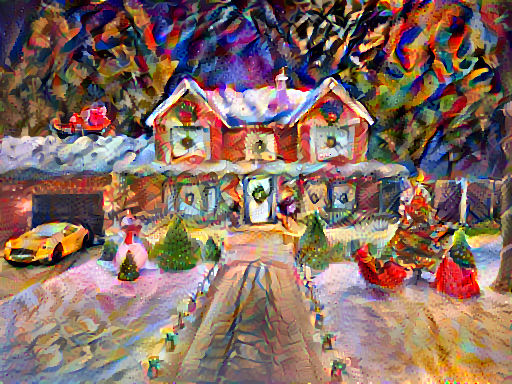

-----------------------------------------------------------------------------------------
Epoch :  16
Train step: 1700


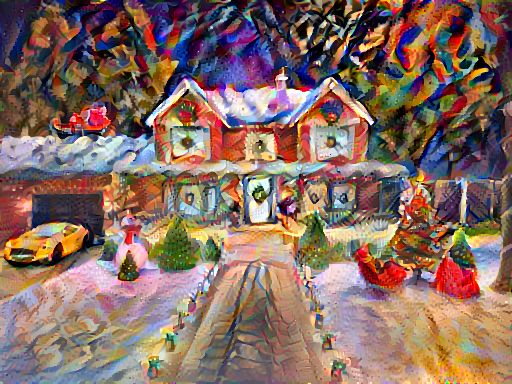

-----------------------------------------------------------------------------------------
Epoch :  17
Train step: 1800


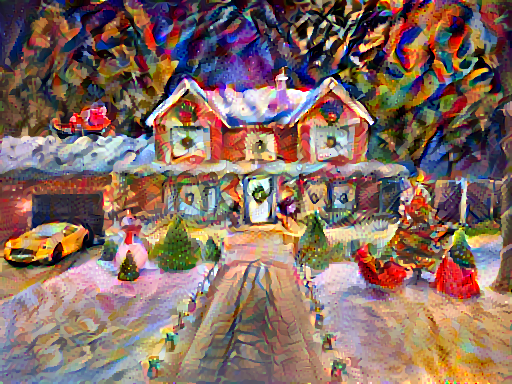

-----------------------------------------------------------------------------------------
Epoch :  18
Train step: 1900


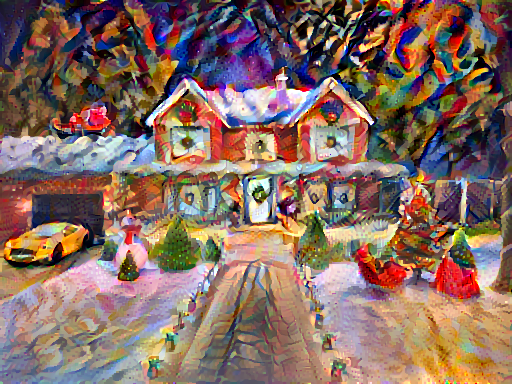

-----------------------------------------------------------------------------------------
Epoch :  19
Train step: 2000


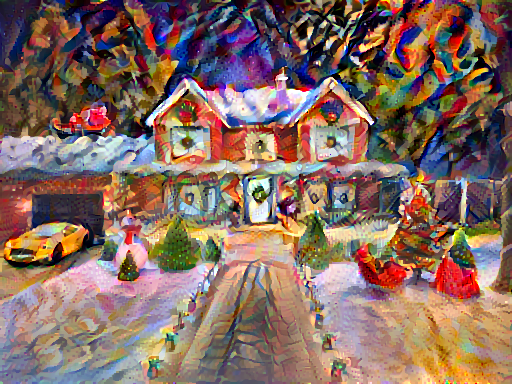

-----------------------------------------------------------------------------------------
Total time: 148.6


In [50]:
import time
import IPython.display as display

start = time.time()

epochs = 20
steps_per_epoch = 100

step = 0
for n in range(epochs):
  print("Epoch : ",n)
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
  print("Train step: {}".format(step))
  display.display(tensor_to_image(image))
  print("-----------------------------------------------------------------------------------------")

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [51]:
file_name = 'stylized-image.png'
tensor_to_image(image).save(file_name)

try:
  from google.colab import files
except ImportError:
   pass
else:
  files.download(file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>